In [33]:
# import necessary packages and define home directory
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
# import git
# repo = git.Repo("./", search_parent_directories=True)
# homedir = repo.working_dir
homedir = r"C:\Users\HyeongChan Jo\OneDrive - California Institute of Technology\class\COVID-19\SKTW"

# If prophet has not been installed, install it with the following lines
# pip install pystan
# pip install fbprophet
# If above ^ command doesn't install, see below issue
# https://github.com/facebook/prophet/issues/775
# pip install fbprophet --no-cache-dir --no-binary :all:
# Also for interactive visualizations you can install Plotly
# pip install plotly

import datetime
from fbprophet import Prophet
from fbprophet.plot import add_changepoints_to_plot
from fbprophet.diagnostics import cross_validation
from fbprophet.diagnostics import performance_metrics
from fbprophet.plot import plot_cross_validation_metric

In [34]:
# function for getting the first day of the week; Prophet requires daily data, so we will just transform from week to day
def prophet_getFirstDayofWeek(yr, wk):
    d = "%s-W%s" % (yr, wk)
    # The -1 and -%w pattern tells the parser to pick the Monday in that week
    firstdayofweek = datetime.datetime.strptime(d + '-1', "%Y-W%W-%w")
    return firstdayofweek

In [35]:
# Prophet also requires dates to be stored in a column called 'ds'
# And that the values to predict will be stored in a column called 'y'
def prophet_changeDfStructure(df, y_name, virusType = None):
    if virusType != None:
        df = df.loc[df['Virus'].isin(virusType)]
    df = df[df['WEEK']<54].copy() # there are some rows with week>=54, which errors out; remove those rows
#     df[:, 'ds'] = df.apply(lambda row: prophet_getFirstDayofWeek(row.YEAR, row.WEEK), axis=1)
#     df[:, 'y'] = df.loc[:, y_name]
    df["ds"] = df.apply(lambda row: prophet_getFirstDayofWeek(row.YEAR, row.WEEK), axis=1)
    df["y"] = df[y_name]
    return df

## percent P&I for each state

In [204]:
# settings for prophet
# changepoint_prior_scale=1
changepoint_prior_scale=0.01
# seasonality_mode='additive' # default
seasonality_mode='multiplicative' # 'additive' default

In [205]:
# define df_PI, which includes a total number of cases of PI in US
df_PI = pd.read_csv(f"{homedir}/data/us/flu/deaths/statewide_pi_deaths_2012_2020.csv")
df_PI.head()

,AREA,SUB AREA,AGE GROUP,SEASON,WEEK,PERCENT P&I,NUM INFLUENZA DEATHS,NUM PNEUMONIA DEATHS,TOTAL DEATHS,PERCENT COMPLETE
0,State,Alabama,All,2019-20,40,5.0,0,48,954,98.2%
1,State,Alabama,All,2019-20,41,3.8,0,36,940,96.8%
2,State,Alabama,All,2019-20,42,4.5,0,45,"1,011",> 100%
3,State,Alabama,All,2019-20,43,4.4,2,42,998,> 100%
4,State,Alabama,All,2019-20,44,5.7,2,53,962,99%


In [206]:
df_PI["YEAR"] = df_PI.apply(lambda row: int(row.SEASON[0:4]), axis=1)
df_PI.loc[df_PI['WEEK']<=26, 'YEAR'] = df_PI.loc[df_PI['WEEK']<=26, 'YEAR']+1
print(df_PI[0:20])

     AREA SUB AREA AGE GROUP   SEASON  WEEK  PERCENT P&I NUM INFLUENZA DEATHS  \
0   State  Alabama       All  2019-20    40          5.0                    0   
1   State  Alabama       All  2019-20    41          3.8                    0   
2   State  Alabama       All  2019-20    42          4.5                    0   
3   State  Alabama       All  2019-20    43          4.4                    2   
4   State  Alabama       All  2019-20    44          5.7                    2   
5   State  Alabama       All  2019-20    45          5.0                    0   
6   State  Alabama       All  2019-20    46          6.1                    0   
7   State  Alabama       All  2019-20    47          4.4                    3   
8   State  Alabama       All  2019-20    48          7.7                    2   
9   State  Alabama       All  2019-20    49          5.3                    2   
10  State  Alabama       All  2019-20    50          5.6                    3   
11  State  Alabama       All

In [207]:
# change the structure of df_PI for prophet
y_name = "PERCENT P&I"
df_PI = prophet_changeDfStructure(df_PI, y_name)
df_PI.tail()

,AREA,SUB AREA,AGE GROUP,SEASON,WEEK,PERCENT P&I,NUM INFLUENZA DEATHS,NUM PNEUMONIA DEATHS,TOTAL DEATHS,PERCENT COMPLETE,YEAR,ds,y
19495,State,New York City,All,2012-13,35,9.3,0,84,907,89%,2012,2012-08-27,9.3
19496,State,New York City,All,2012-13,36,8.7,0,78,893,87.6%,2012,2012-09-03,8.7
19497,State,New York City,All,2012-13,37,9.1,0,84,923,90.6%,2012,2012-09-10,9.1
19498,State,New York City,All,2012-13,38,9.6,0,91,947,92.9%,2012,2012-09-17,9.6
19499,State,New York City,All,2012-13,39,8.4,0,82,980,96.2%,2012,2012-09-24,8.4


In [208]:
# get the list of states
stateList = df_PI['SUB AREA'].unique()
print(stateList)
print(len(stateList))

['Alabama' 'Alaska' 'Arizona' 'Arkansas' 'California' 'Colorado'
 'Connecticut' 'Delaware' 'District of Columbia' 'Florida' 'Georgia'
 'Hawaii' 'Idaho' 'Illinois' 'Indiana' 'Iowa' 'Kansas' 'Kentucky'
 'Louisiana' 'Maine' 'Maryland' 'Massachusetts' 'Michigan' 'Minnesota'
 'Mississippi' 'Missouri' 'Montana' 'Nebraska' 'Nevada' 'New Hampshire'
 'New Jersey' 'New Mexico' 'New York' 'North Carolina' 'North Dakota'
 'Ohio' 'Oklahoma' 'Oregon' 'Pennsylvania' 'Rhode Island' 'South Carolina'
 'South Dakota' 'Tennessee' 'Texas' 'Utah' 'Vermont' 'Virginia'
 'Washington' 'West Virginia' 'Wisconsin' 'Wyoming' 'New York City']
52


In [209]:
# train prophet for each state, and make predictions
m_PI_eachState = []
forecast_eachState = []
for state in stateList:
    # select state
    df_temp = df_PI.loc[df_PI['SUB AREA'] == state]
    
    # train prophet
    m_PI = Prophet(changepoint_prior_scale = changepoint_prior_scale, seasonality_mode = seasonality_mode)
    m_PI.fit(df_temp)
    
    # make prediction
    future = m_PI.make_future_dataframe(periods=90)
    forecast = m_PI.predict(future)

    # save in the list
    m_PI_eachState.append(m_PI)
    forecast_eachState.append(forecast)
    

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seaso

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seaso

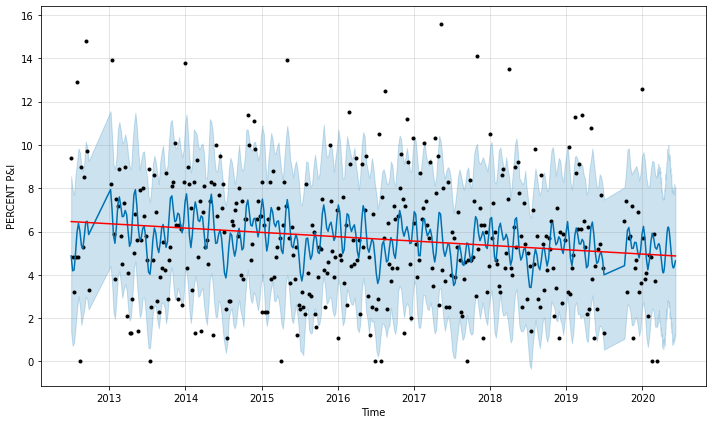

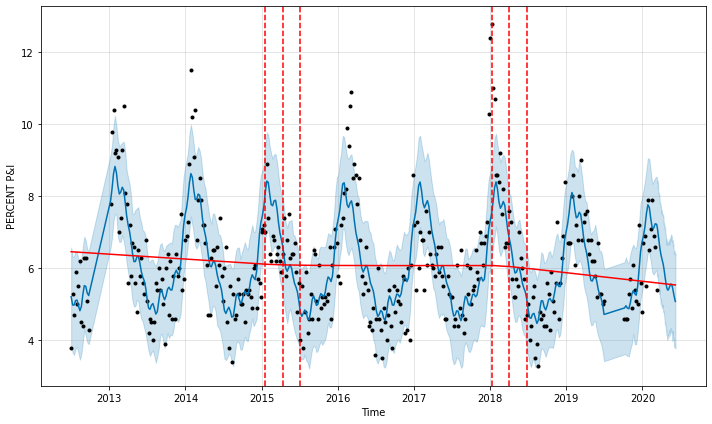

In [106]:
i = 1
fig1 = m_PI_eachState[i].plot(forecast_eachState[i], xlabel="Time", ylabel=y_name)
a=add_changepoints_to_plot(fig1.gca(), m_PI_eachState[i], forecast_eachState[i])

i = 2
fig2 = m_PI_eachState[i].plot(forecast_eachState[i], xlabel="Time", ylabel=y_name)
a=add_changepoints_to_plot(fig2.gca(), m_PI_eachState[i], forecast_eachState[i])

C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:146: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(npanel, 1, facecolor='w', figsize=figsize)
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:146: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(npanel, 1, facecolor='w', figsize=figsize)
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:146: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface 

C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:146: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(npanel, 1, facecolor='w', figsize=figsize)
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:146: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(npanel, 1, facecolor='w', figsize=figsize)
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:146: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface 

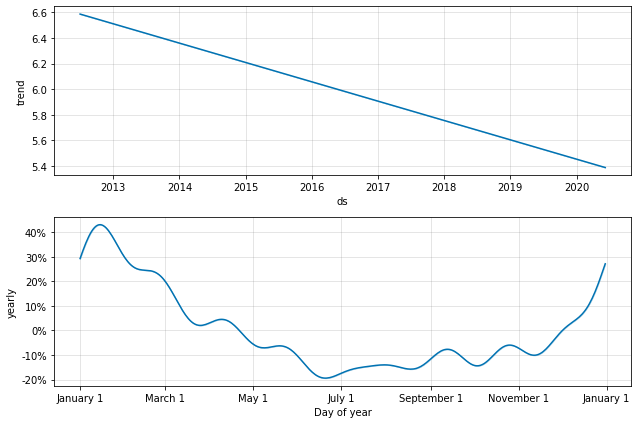

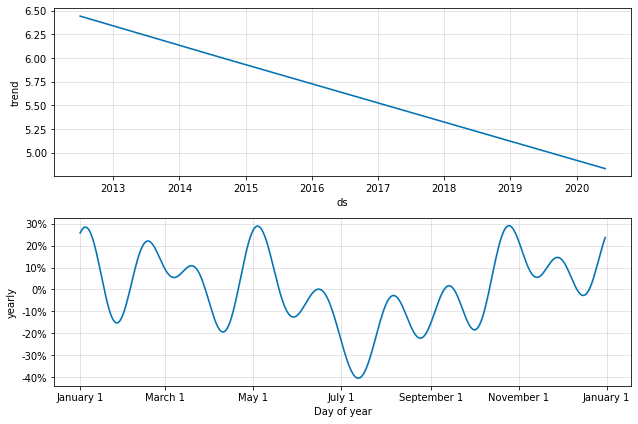

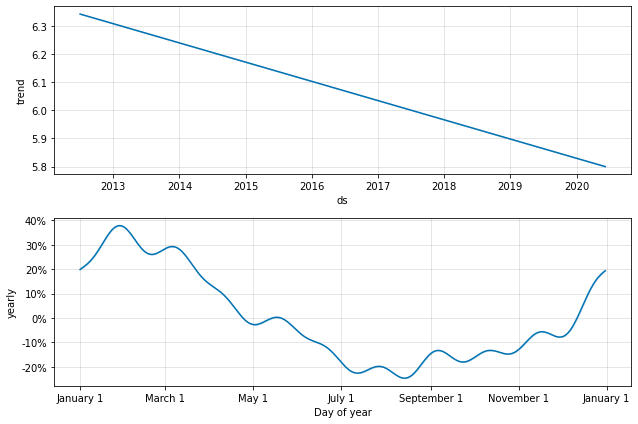

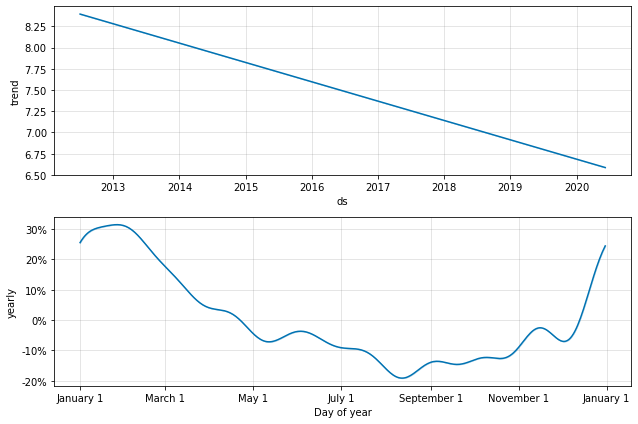

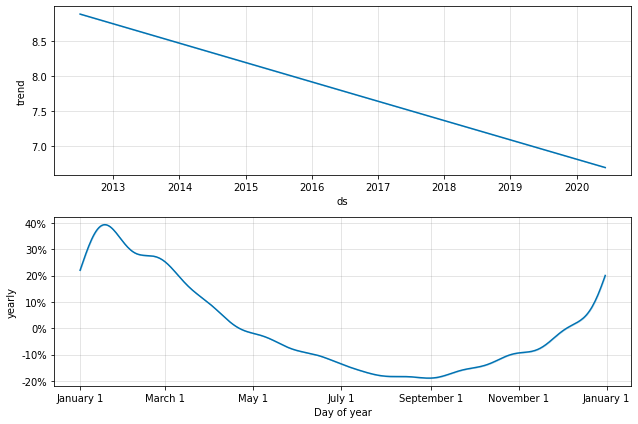

...

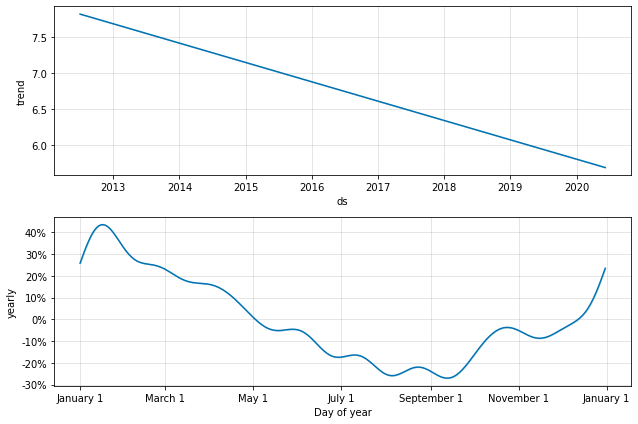

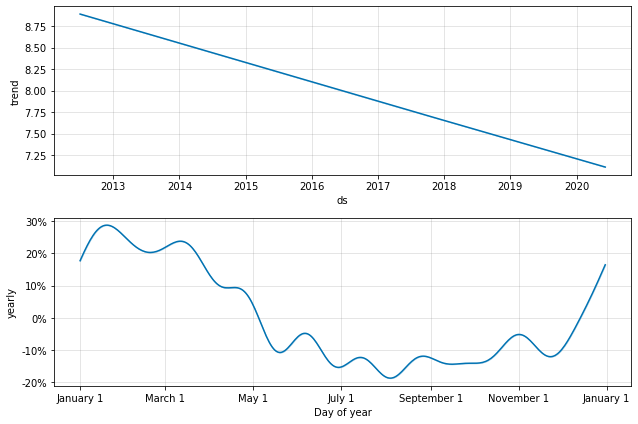

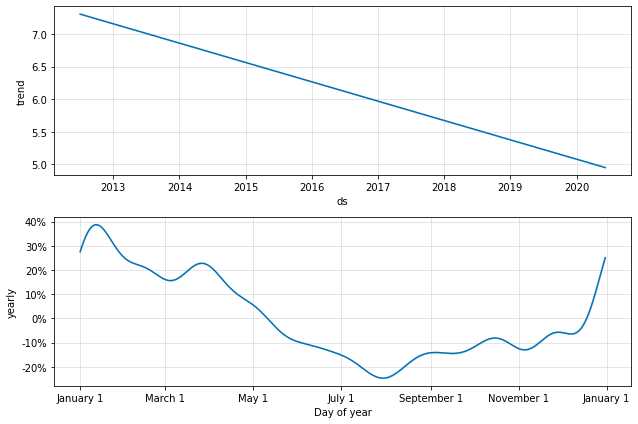

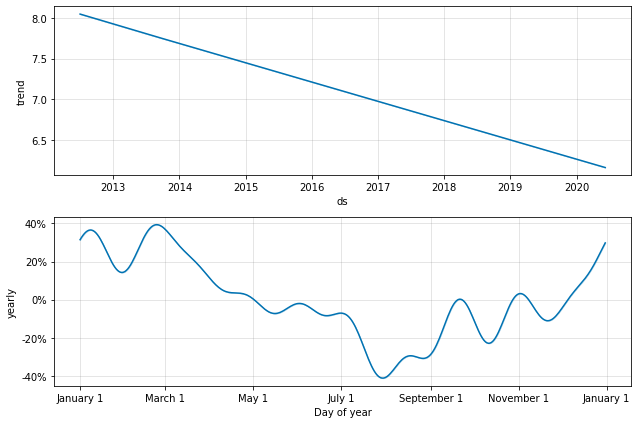

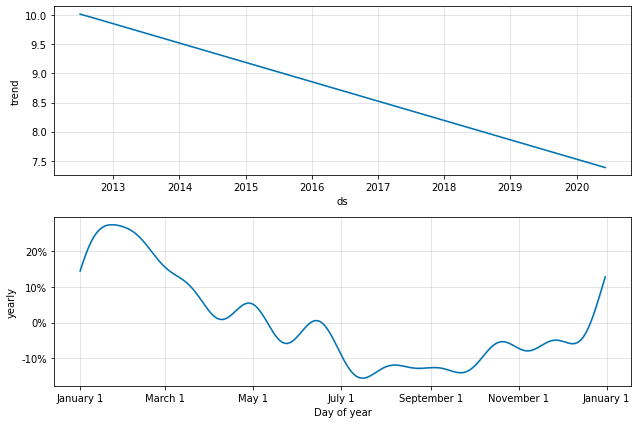

In [217]:
df = pd.DataFrame(None, columns = ['state', 'date', 'seasonality'])
for i in range(len(m_PI_eachState)):
    state = stateList[i]
    fig = m_PI_eachState[i].plot_components(forecast_eachState[i])
    ax = plt.gca()
    line = ax.lines[0]
    y_test = line.get_ydata()
    x_test = line.get_xdata()

    df_temp = pd.DataFrame(data = {'state': state, 'date': x_test, 'seasonality': y_test})
    df = pd.concat([df, df_temp], ignore_index = True)
    
df.to_csv('seasonality_stateLevel.csv')

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17 s
Complete: state  Alabama , scale  0.005


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 17.2 s
Complete: state  Alaska , scale  0.005


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.1 s
Complete: state  Arizona , scale  0.005


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.3 s
Complete: state  Arkansas , scale  0.005


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.3 s
Complete: state  California , scale  0.005


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 12 forecasts with cutoffs between 2018-07-10 00:00:00 and 2019-06-05 00:00:00


Wall time: 17.2 s
Complete: state  Colorado , scale  0.005


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-11 00:00:00 and 2019-09-04 00:00:00


Wall time: 13.7 s
Complete: state  Connecticut , scale  0.005


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 16.9 s
Complete: state  Delaware , scale  0.005


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.2 s
Complete: state  District of Columbia , scale  0.005


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.1 s
Complete: state  Florida , scale  0.005


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.1 s
Complete: state  Georgia , scale  0.005


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17 s
Complete: state  Hawaii , scale  0.005


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 16.7 s
Complete: state  Idaho , scale  0.005


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.2 s
Complete: state  Illinois , scale  0.005


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 16.9 s
Complete: state  Indiana , scale  0.005


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 16.9 s
Complete: state  Iowa , scale  0.005


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 16.9 s
Complete: state  Kansas , scale  0.005


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 17.1 s
Complete: state  Kentucky , scale  0.005


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.1 s
Complete: state  Louisiana , scale  0.005


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.1 s
Complete: state  Maine , scale  0.005


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 16.9 s
Complete: state  Maryland , scale  0.005


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.1 s
Complete: state  Massachusetts , scale  0.005


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17 s
Complete: state  Michigan , scale  0.005


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.1 s
Complete: state  Minnesota , scale  0.005


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.4 s
Complete: state  Mississippi , scale  0.005


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 16.8 s
Complete: state  Missouri , scale  0.005


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 16.9 s
Complete: state  Montana , scale  0.005


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.3 s
Complete: state  Nebraska , scale  0.005


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17 s
Complete: state  Nevada , scale  0.005


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 16.8 s
Complete: state  New Hampshire , scale  0.005


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.1 s
Complete: state  New Jersey , scale  0.005


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.3 s
Complete: state  New Mexico , scale  0.005


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 14 forecasts with cutoffs between 2018-07-06 00:00:00 and 2019-07-31 00:00:00


Wall time: 16.9 s
Complete: state  New York , scale  0.005


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 15.9 s
Complete: state  North Carolina , scale  0.005


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.2 s
Complete: state  North Dakota , scale  0.005


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 16.9 s
Complete: state  Ohio , scale  0.005


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17 s
Complete: state  Oklahoma , scale  0.005


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 17 s
Complete: state  Oregon , scale  0.005


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.3 s
Complete: state  Pennsylvania , scale  0.005


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 16.9 s
Complete: state  Rhode Island , scale  0.005


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 16.9 s
Complete: state  South Carolina , scale  0.005


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17 s
Complete: state  South Dakota , scale  0.005


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.1 s
Complete: state  Tennessee , scale  0.005


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 17.1 s
Complete: state  Texas , scale  0.005


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17 s
Complete: state  Utah , scale  0.005


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.2 s
Complete: state  Vermont , scale  0.005


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17 s
Complete: state  Virginia , scale  0.005


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-11 00:00:00 and 2019-09-04 00:00:00


Wall time: 17.1 s
Complete: state  Washington , scale  0.005


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.3 s
Complete: state  West Virginia , scale  0.005


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.3 s
Complete: state  Wisconsin , scale  0.005


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 17.2 s
Complete: state  Wyoming , scale  0.005


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.2 s
Complete: state  New York City , scale  0.005


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.5 s
Complete: state  Alabama , scale  0.01


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.1 s
Complete: state  Alaska , scale  0.01


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.4 s
Complete: state  Arizona , scale  0.01


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.2 s
Complete: state  Arkansas , scale  0.01


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.1 s
Complete: state  California , scale  0.01


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 12 forecasts with cutoffs between 2018-07-10 00:00:00 and 2019-06-05 00:00:00


Wall time: 17.2 s
Complete: state  Colorado , scale  0.01


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-11 00:00:00 and 2019-09-04 00:00:00


Wall time: 13.7 s
Complete: state  Connecticut , scale  0.01


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.3 s
Complete: state  Delaware , scale  0.01


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17 s
Complete: state  District of Columbia , scale  0.01


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.2 s
Complete: state  Florida , scale  0.01


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.5 s
Complete: state  Georgia , scale  0.01


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 16.9 s
Complete: state  Hawaii , scale  0.01


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 17 s
Complete: state  Idaho , scale  0.01


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 17.3 s
Complete: state  Illinois , scale  0.01


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.8 s
Complete: state  Indiana , scale  0.01


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.2 s
Complete: state  Iowa , scale  0.01


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.2 s
Complete: state  Kansas , scale  0.01


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.2 s
Complete: state  Kentucky , scale  0.01


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.4 s
Complete: state  Louisiana , scale  0.01


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.2 s
Complete: state  Maine , scale  0.01


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17 s
Complete: state  Maryland , scale  0.01


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.1 s
Complete: state  Massachusetts , scale  0.01


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 17.1 s
Complete: state  Michigan , scale  0.01


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.2 s
Complete: state  Minnesota , scale  0.01


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17 s
Complete: state  Mississippi , scale  0.01


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.3 s
Complete: state  Missouri , scale  0.01


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.1 s
Complete: state  Montana , scale  0.01


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 17 s
Complete: state  Nebraska , scale  0.01


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.4 s
Complete: state  Nevada , scale  0.01


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.2 s
Complete: state  New Hampshire , scale  0.01


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.2 s
Complete: state  New Jersey , scale  0.01


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.2 s
Complete: state  New Mexico , scale  0.01


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 14 forecasts with cutoffs between 2018-07-06 00:00:00 and 2019-07-31 00:00:00


Wall time: 17.1 s
Complete: state  New York , scale  0.01


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 16 s
Complete: state  North Carolina , scale  0.01


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.1 s
Complete: state  North Dakota , scale  0.01


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.2 s
Complete: state  Ohio , scale  0.01


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 16.9 s
Complete: state  Oklahoma , scale  0.01


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 17.1 s
Complete: state  Oregon , scale  0.01


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.4 s
Complete: state  Pennsylvania , scale  0.01


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.1 s
Complete: state  Rhode Island , scale  0.01


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 16.8 s
Complete: state  South Carolina , scale  0.01


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.2 s
Complete: state  South Dakota , scale  0.01


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.7 s
Complete: state  Tennessee , scale  0.01


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.1 s
Complete: state  Texas , scale  0.01


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17 s
Complete: state  Utah , scale  0.01


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 16.9 s
Complete: state  Vermont , scale  0.01


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.1 s
Complete: state  Virginia , scale  0.01


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-11 00:00:00 and 2019-09-04 00:00:00


Wall time: 17.3 s
Complete: state  Washington , scale  0.01


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 17.2 s
Complete: state  West Virginia , scale  0.01


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.5 s
Complete: state  Wisconsin , scale  0.01


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 17.1 s
Complete: state  Wyoming , scale  0.01


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.4 s
Complete: state  New York City , scale  0.01


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.3 s
Complete: state  Alabama , scale  0.025


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17 s
Complete: state  Alaska , scale  0.025


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.4 s
Complete: state  Arizona , scale  0.025


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 17.4 s
Complete: state  Arkansas , scale  0.025


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 17.7 s
Complete: state  California , scale  0.025


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 12 forecasts with cutoffs between 2018-07-10 00:00:00 and 2019-06-05 00:00:00


Wall time: 17.5 s
Complete: state  Colorado , scale  0.025


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-11 00:00:00 and 2019-09-04 00:00:00


Wall time: 13.9 s
Complete: state  Connecticut , scale  0.025


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.4 s
Complete: state  Delaware , scale  0.025


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 16.9 s
Complete: state  District of Columbia , scale  0.025


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.7 s
Complete: state  Florida , scale  0.025


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 17.7 s
Complete: state  Georgia , scale  0.025


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 17.3 s
Complete: state  Hawaii , scale  0.025


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 16.9 s
Complete: state  Idaho , scale  0.025


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 17.3 s
Complete: state  Illinois , scale  0.025


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 17.6 s
Complete: state  Indiana , scale  0.025


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 17.4 s
Complete: state  Iowa , scale  0.025


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.3 s
Complete: state  Kansas , scale  0.025


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.5 s
Complete: state  Kentucky , scale  0.025


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.6 s
Complete: state  Louisiana , scale  0.025


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 16.9 s
Complete: state  Maine , scale  0.025


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.8 s
Complete: state  Maryland , scale  0.025


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 17.7 s
Complete: state  Massachusetts , scale  0.025


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 17.4 s
Complete: state  Michigan , scale  0.025


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 17.6 s
Complete: state  Minnesota , scale  0.025


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.5 s
Complete: state  Mississippi , scale  0.025


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.5 s
Complete: state  Missouri , scale  0.025


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17 s
Complete: state  Montana , scale  0.025


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 18 s
Complete: state  Nebraska , scale  0.025


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.4 s
Complete: state  Nevada , scale  0.025


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17 s
Complete: state  New Hampshire , scale  0.025


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 17.8 s
Complete: state  New Jersey , scale  0.025


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.6 s
Complete: state  New Mexico , scale  0.025


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 17.1 s
Complete: state  New York , scale  0.025


INFO:fbprophet:Making 14 forecasts with cutoffs between 2018-07-06 00:00:00 and 2019-07-31 00:00:00
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 16.3 s
Complete: state  North Carolina , scale  0.025


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.3 s
Complete: state  North Dakota , scale  0.025


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.4 s
Complete: state  Ohio , scale  0.025


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.2 s
Complete: state  Oklahoma , scale  0.025


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 17.2 s
Complete: state  Oregon , scale  0.025


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 18 s
Complete: state  Pennsylvania , scale  0.025


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 17.4 s
Complete: state  Rhode Island , scale  0.025


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 16.9 s
Complete: state  South Carolina , scale  0.025


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.4 s
Complete: state  South Dakota , scale  0.025


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.3 s
Complete: state  Tennessee , scale  0.025


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17 s
Complete: state  Texas , scale  0.025


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.4 s
Complete: state  Utah , scale  0.025


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 17.3 s
Complete: state  Vermont , scale  0.025


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.1 s
Complete: state  Virginia , scale  0.025


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 17.3 s
Complete: state  Washington , scale  0.025


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-11 00:00:00 and 2019-09-04 00:00:00
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.3 s
Complete: state  West Virginia , scale  0.025


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.1 s
Complete: state  Wisconsin , scale  0.025


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.6 s
Complete: state  Wyoming , scale  0.025


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 17.6 s
Complete: state  New York City , scale  0.025


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.4 s
Complete: state  Alabama , scale  0.05


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 17.4 s
Complete: state  Alaska , scale  0.05


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 17.4 s
Complete: state  Arizona , scale  0.05


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 17.3 s
Complete: state  Arkansas , scale  0.05


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 18.2 s
Complete: state  California , scale  0.05


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 12 forecasts with cutoffs between 2018-07-10 00:00:00 and 2019-06-05 00:00:00


Wall time: 17.6 s
Complete: state  Colorado , scale  0.05


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 14 s
Complete: state  Connecticut , scale  0.05


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-11 00:00:00 and 2019-09-04 00:00:00
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.5 s
Complete: state  Delaware , scale  0.05


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 17.1 s
Complete: state  District of Columbia , scale  0.05


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 18 s
Complete: state  Florida , scale  0.05


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.4 s
Complete: state  Georgia , scale  0.05


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17 s
Complete: state  Hawaii , scale  0.05


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 17.2 s
Complete: state  Idaho , scale  0.05


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 17.6 s
Complete: state  Illinois , scale  0.05


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 17.8 s
Complete: state  Indiana , scale  0.05


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.5 s
Complete: state  Iowa , scale  0.05


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.5 s
Complete: state  Kansas , scale  0.05


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 17.2 s
Complete: state  Kentucky , scale  0.05


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.3 s
Complete: state  Louisiana , scale  0.05


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 17.2 s
Complete: state  Maine , scale  0.05


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.6 s
Complete: state  Maryland , scale  0.05


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.5 s
Complete: state  Massachusetts , scale  0.05


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 17.4 s
Complete: state  Michigan , scale  0.05


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 17.8 s
Complete: state  Minnesota , scale  0.05


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.1 s
Complete: state  Mississippi , scale  0.05


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.8 s
Complete: state  Missouri , scale  0.05


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 17.3 s
Complete: state  Montana , scale  0.05


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 17.6 s
Complete: state  Nebraska , scale  0.05


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.7 s
Complete: state  Nevada , scale  0.05


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.3 s
Complete: state  New Hampshire , scale  0.05


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.5 s
Complete: state  New Jersey , scale  0.05


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 17.3 s
Complete: state  New Mexico , scale  0.05


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 17.3 s
Complete: state  New York , scale  0.05


INFO:fbprophet:Making 14 forecasts with cutoffs between 2018-07-06 00:00:00 and 2019-07-31 00:00:00
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 16.6 s
Complete: state  North Carolina , scale  0.05


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.1 s
Complete: state  North Dakota , scale  0.05


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.5 s
Complete: state  Ohio , scale  0.05


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.1 s
Complete: state  Oklahoma , scale  0.05


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 17.3 s
Complete: state  Oregon , scale  0.05


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.8 s
Complete: state  Pennsylvania , scale  0.05


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 17.1 s
Complete: state  Rhode Island , scale  0.05


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.2 s
Complete: state  South Carolina , scale  0.05


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 17.2 s
Complete: state  South Dakota , scale  0.05


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 17.5 s
Complete: state  Tennessee , scale  0.05


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.9 s
Complete: state  Texas , scale  0.05


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.2 s
Complete: state  Utah , scale  0.05


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 17.1 s
Complete: state  Vermont , scale  0.05


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 17.4 s
Complete: state  Virginia , scale  0.05


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 17.7 s
Complete: state  Washington , scale  0.05


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-11 00:00:00 and 2019-09-04 00:00:00
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.1 s
Complete: state  West Virginia , scale  0.05


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 17.1 s
Complete: state  Wisconsin , scale  0.05


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 18.1 s
Complete: state  Wyoming , scale  0.05


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 17.8 s
Complete: state  New York City , scale  0.05


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 17.9 s
Complete: state  Alabama , scale  0.1


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.8 s
Complete: state  Alaska , scale  0.1


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 17.8 s
Complete: state  Arizona , scale  0.1


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 18.5 s
Complete: state  Arkansas , scale  0.1


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 18.5 s
Complete: state  California , scale  0.1


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 12 forecasts with cutoffs between 2018-07-10 00:00:00 and 2019-06-05 00:00:00


Wall time: 17.7 s
Complete: state  Colorado , scale  0.1


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-11 00:00:00 and 2019-09-04 00:00:00


Wall time: 14.1 s
Complete: state  Connecticut , scale  0.1


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.1 s
Complete: state  Delaware , scale  0.1


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 17.1 s
Complete: state  District of Columbia , scale  0.1


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 18.2 s
Complete: state  Florida , scale  0.1


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 18.5 s
Complete: state  Georgia , scale  0.1


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.8 s
Complete: state  Hawaii , scale  0.1


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 17.3 s
Complete: state  Idaho , scale  0.1


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 17.6 s
Complete: state  Illinois , scale  0.1


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 17.4 s
Complete: state  Indiana , scale  0.1


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 17.6 s
Complete: state  Iowa , scale  0.1


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 18.1 s
Complete: state  Kansas , scale  0.1


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 17.6 s
Complete: state  Kentucky , scale  0.1


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 17.8 s
Complete: state  Louisiana , scale  0.1


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 17.6 s
Complete: state  Maine , scale  0.1


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 17.7 s
Complete: state  Maryland , scale  0.1


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 17.6 s
Complete: state  Massachusetts , scale  0.1


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 18.1 s
Complete: state  Michigan , scale  0.1


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 17.8 s
Complete: state  Minnesota , scale  0.1


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 17.7 s
Complete: state  Mississippi , scale  0.1


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 18.2 s
Complete: state  Missouri , scale  0.1


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.3 s
Complete: state  Montana , scale  0.1


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 17.1 s
Complete: state  Nebraska , scale  0.1


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.6 s
Complete: state  Nevada , scale  0.1


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 17.8 s
Complete: state  New Hampshire , scale  0.1


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 18.3 s
Complete: state  New Jersey , scale  0.1


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.4 s
Complete: state  New Mexico , scale  0.1


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 19.2 s
Complete: state  New York , scale  0.1


INFO:fbprophet:Making 14 forecasts with cutoffs between 2018-07-06 00:00:00 and 2019-07-31 00:00:00
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 16.4 s
Complete: state  North Carolina , scale  0.1


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 17.2 s
Complete: state  North Dakota , scale  0.1


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 18.6 s
Complete: state  Ohio , scale  0.1


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.9 s
Complete: state  Oklahoma , scale  0.1


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 17.3 s
Complete: state  Oregon , scale  0.1


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 18.9 s
Complete: state  Pennsylvania , scale  0.1


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 17.7 s
Complete: state  Rhode Island , scale  0.1


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.7 s
Complete: state  South Carolina , scale  0.1


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 17.2 s
Complete: state  South Dakota , scale  0.1


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 18 s
Complete: state  Tennessee , scale  0.1


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 18.5 s
Complete: state  Texas , scale  0.1


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 16.9 s
Complete: state  Utah , scale  0.1


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 17.2 s
Complete: state  Vermont , scale  0.1


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 17.8 s
Complete: state  Virginia , scale  0.1


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 17.7 s
Complete: state  Washington , scale  0.1


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-11 00:00:00 and 2019-09-04 00:00:00
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17 s
Complete: state  West Virginia , scale  0.1


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 18 s
Complete: state  Wisconsin , scale  0.1


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00
C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Wall time: 17.7 s
Complete: state  Wyoming , scale  0.1


INFO:fbprophet:Making 15 forecasts with cutoffs between 2018-07-18 00:00:00 and 2019-09-11 00:00:00


Wall time: 17.7 s
Complete: state  New York City , scale  0.1


C:\Users\HyeongChan Jo\Anaconda3\lib\site-packages\fbprophet\plot.py:487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)


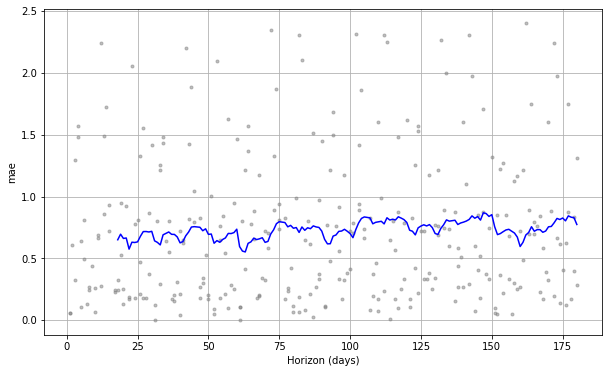

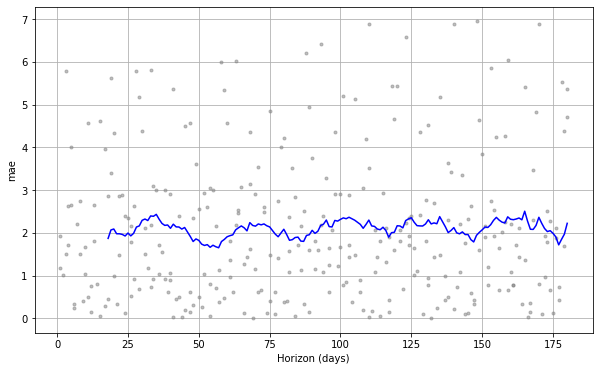

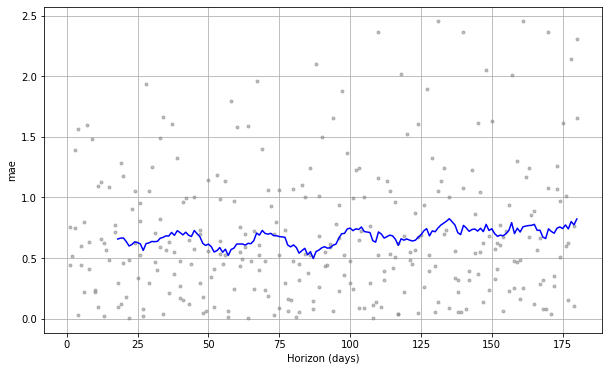

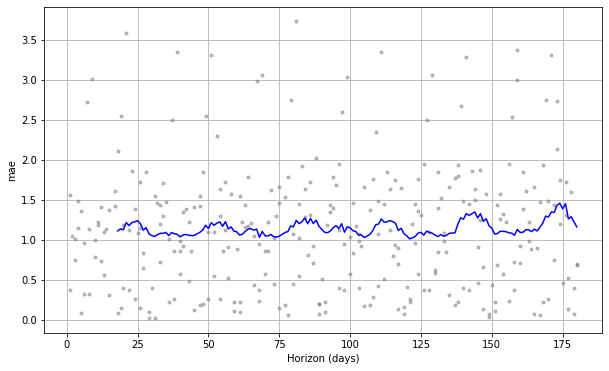

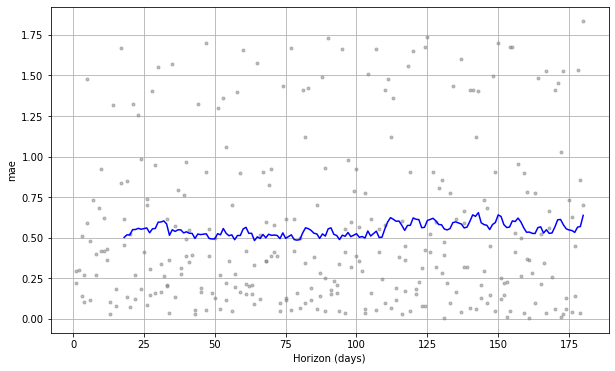

...

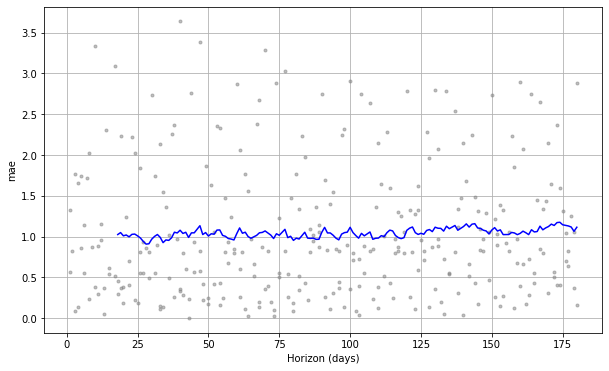

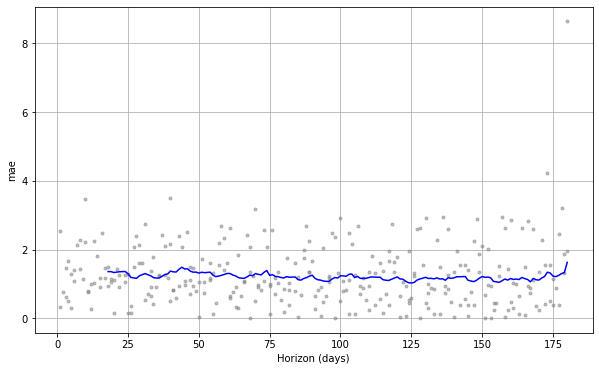

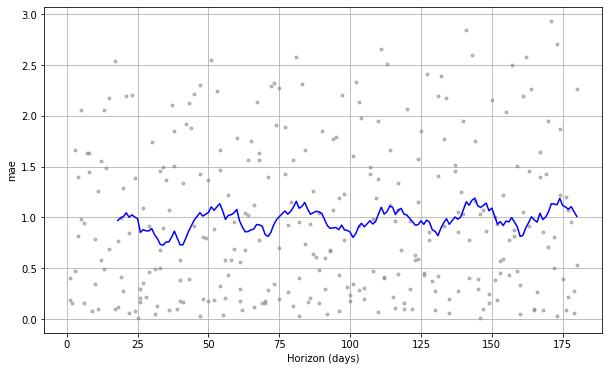

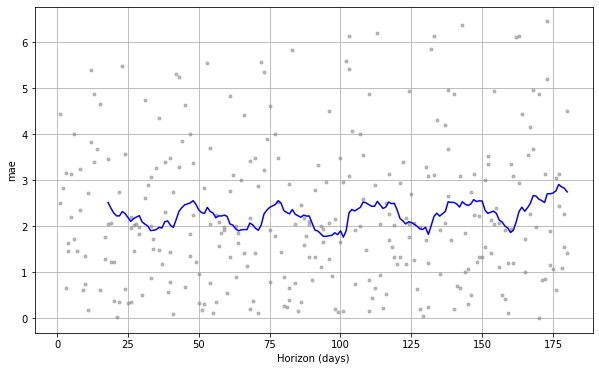

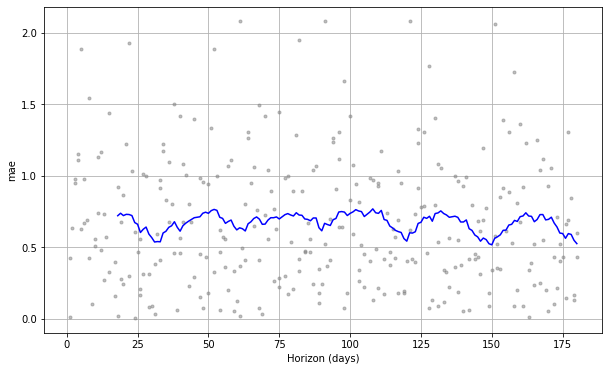

In [118]:
# assess the performance with different settings
changepoint_prior_scale_list = [0.005, 0.01, 0.025, 0.05, 0.1]
#seasonality_mode_list={'multiplicative', 'additive'}
mode = 'multiplicative'

m_PI_diffSettings = []
df_cv_diffSettings = []
for i, scale in enumerate(changepoint_prior_scale_list):
    m_PI_diffSettings.append([])
    df_cv_diffSettings.append([])
    for j, state in enumerate(stateList):
        df_temp = df_PI.loc[df_PI['SUB AREA'] == state]
        
        m_temp = Prophet(changepoint_prior_scale = scale, seasonality_mode = mode)
        m_temp.fit(df_temp)
        m_PI_diffSettings[i].append(m_temp)
        
        %time df_cv_temp = cross_validation(m_temp, initial='%i days' % (6 * 365), period='30 days', horizon = '180 days')
        df_cv_diffSettings[i].append(df_cv_temp)
        plot_cross_validation_metric(df_cv_temp, metric='mae')
        
        print("Complete: state ", state, ", scale ", scale)

In [120]:
# get performance metrics
df_p_PI = []
mae_PI = []
for i in range(len(changepoint_prior_scale_list)):
    df_p_PI.append([])
    mae_PI.append([])
    for j in range(len(stateList)):
        df_p_PI_temp = performance_metrics(df_cv_diffSettings[i][j])
        df_p_PI[i].append(df_p_PI_temp)
        mae_PI[i].append(df_p_PI_temp['mae'])



INFO:fbprophet:Skipping MAPE because y close to 0
INFO:fbprophet:Skipping MAPE because y close to 0
INFO:fbprophet:Skipping MAPE because y close to 0
INFO:fbprophet:Skipping MAPE because y close to 0
INFO:fbprophet:Skipping MAPE because y close to 0
INFO:fbprophet:Skipping MAPE because y close to 0
INFO:fbprophet:Skipping MAPE because y close to 0
INFO:fbprophet:Skipping MAPE because y close to 0
INFO:fbprophet:Skipping MAPE because y close to 0
INFO:fbprophet:Skipping MAPE because y close to 0


NameError: name 'df_p_ILI' is not defined

In [202]:
mae_PI_np = [[np.mean(x.to_numpy()) for x in y] for y in mae_PI]
mae_PI_np = np.array(mae_PI_np)

mae_PI_np = np.mean(mae_PI_np, axis = 1)
print(mae_PI_np)

# mae_PI_np_mean = []
# mae_PI_np_std = []
# for scaleIdx in range(1):
#     mae_PI_np_mean.append(np.array(mae_PI_np[scaleIdx, :]))

# print(np.array(mae_PI_np_mean[0]))
# mae_PI_mean = [np.mean(x) for x in mae_PI]
# test = [len(mae_PI[0][x]) for x in range(52)]
# print(test)

[1.07782461 1.07463194 1.08535638 1.10541267 1.1286691 ]
[array([0.65026911, 0.69540094, 0.66100383, 0.6646534 , 0.57463545,
       0.63056283, 0.6282103 , 0.63330994, 0.67841344, 0.71639299,
       0.71699351, 0.71326746, 0.71854517, 0.64157679, 0.62908487,
       0.60866348, 0.69037194, 0.70210722, 0.7132096 , 0.69429612,
       0.69347752, 0.67308304, 0.6253747 , 0.63603636, 0.68246284,
       0.71265462, 0.75316704, 0.75633172, 0.75133444, 0.72324867,
       0.73877191, 0.69390053, 0.69678792, 0.62222243, 0.64348437,
       0.62997914, 0.65232664, 0.665196  , 0.7016251 , 0.70039041,
       0.70812104, 0.73565267, 0.59492615, 0.55892256, 0.55193501,
       0.6214624 , 0.63329149, 0.66322182, 0.65167512, 0.657944  ,
       0.66679055, 0.62932059, 0.63687323, 0.69732921, 0.73073033,
       0.78048395, 0.79630588, 0.78950285, 0.75488973, 0.76658743,
       0.74332947, 0.7491656 , 0.70949201, 0.75368066, 0.72678835,
       0.74731734, 0.73979597, 0.76242091, 0.7540373 , 0.74989675,
    